In [1]:
from backtesting import Backtest, Strategy
from backtesting.lib import crossover, SignalStrategy, TrailingStrategy
from backtesting.test import SMA
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd 
import math as m
import os, glob

/Users/marami3/anaconda3/lib/python3.7/site-packages/backtesting/_plotting.py:34: UserWarning: Jupyter Notebook detected. Setting Bokeh output to notebook. This may not work in Jupyter clients without JavaScript support (e.g. PyCharm, Spyder IDE). Reset with `bokeh.io.reset_output()`.
  warnings.warn('Jupyter Notebook detected. '


Loading BokehJS ...

In [2]:
#LOAD DATASET
cwd = os.getcwd()
source_data = os.path.join(cwd, r'forex historic/dukascopy/proj_deep/')
filenames = glob.glob(source_data + "/*.csv")
filenames.sort()
for file in filenames:
    print(os.path.basename(file))
DF_EURUSD_ASK = pd.read_csv(filenames[0], index_col=None, parse_dates=True, header=0)
print(DF_EURUSD_ASK.shape)
DF_EURUSD_ASK = DF_EURUSD_ASK.iloc[:200,:]
print(DF_EURUSD_ASK.shape)

EURUSD_Candlestick_1_Hour_ASK_31.07.2018-31.07.2019.csv
EURUSD_Candlestick_1_Hour_BID_31.07.2018-31.07.2019.csv
(6251, 6)
(200, 6)


In [3]:
def get_rsi_timeseries(prices, n=14):
    
    deltas = (prices-prices.shift(1)).fillna(0)

    avg_of_gains = deltas[1:n+1][deltas > 0].sum() / n
    avg_of_losses = -deltas[1:n+1][deltas < 0].sum() / n

    # Set up pd.Series container for RSI values
    rsi_series = pd.Series(0.0, deltas.index)

    # Now calculate RSI using the Wilder smoothing method, starting with n+1 delta.
    up = lambda x: x if x > 0 else 0
    down = lambda x: -x if x < 0 else 0
    i = n+1
    for d in deltas[n+1:]:
        avg_of_gains = ((avg_of_gains * (n-1)) + up(d)) / n
        avg_of_losses = ((avg_of_losses * (n-1)) + down(d)) / n
        if avg_of_losses != 0:
            rs = avg_of_gains / avg_of_losses
            rsi_series[i] = 100 - (100 / (1 + rs))
        else:
            rsi_series[i] = 100
        i += 1

    return rsi_series

close_max = DF_EURUSD_ASK['Close'].max()
close_min = DF_EURUSD_ASK['Close'].min()
rsi = (get_rsi_timeseries(DF_EURUSD_ASK['Close'],14))/100
DF_EURUSD_ASK['rsi'] = (((close_max-close_min)*rsi))+close_min
DF_EURUSD_ASK['Up'] = (((close_max-close_min)*70)/100)+close_min
DF_EURUSD_ASK['Down'] = (((close_max-close_min)*30)/100)+close_min
print(DF_EURUSD_ASK.tail(5))

                    Gmt time     Open     High      Low    Close      Volume  \
195  13.08.2018 03:00:00.000  1.13780  1.13880  1.13773  1.13828   6598.1401   
196  13.08.2018 04:00:00.000  1.13828  1.13843  1.13652  1.13670   7412.9600   
197  13.08.2018 05:00:00.000  1.13670  1.13967  1.13670  1.13872  13824.3799   
198  13.08.2018 06:00:00.000  1.13869  1.14069  1.13816  1.13917  16686.9297   
199  13.08.2018 07:00:00.000  1.13919  1.13986  1.13678  1.13746  15949.9404   

          rsi        Up      Down  
195  1.146112  1.159345  1.146405  
196  1.145017  1.159345  1.146405  
197  1.148335  1.159345  1.146405  
198  1.148999  1.159345  1.146405  
199  1.147573  1.159345  1.146405  


In [4]:
datetime = pd.to_datetime(DF_EURUSD_ASK['Gmt time'])
DF_EURUSD_ASK['datetime'] = datetime
DF_EURUSD_ASK['day_of_week'] = datetime.dt.dayofweek
print(DF_EURUSD_ASK.head(5))

                  Gmt time     Open     High      Low    Close     Volume  \
0  01.08.2018 00:00:00.000  1.16894  1.16926  1.16885  1.16905  6394.8501   
1  01.08.2018 01:00:00.000  1.16905  1.16914  1.16832  1.16895  7304.5498   
2  01.08.2018 02:00:00.000  1.16896  1.16920  1.16823  1.16854  6709.3501   
3  01.08.2018 03:00:00.000  1.16854  1.16880  1.16799  1.16799  6154.0601   
4  01.08.2018 04:00:00.000  1.16799  1.16833  1.16761  1.16779  5269.6699   

      rsi        Up      Down            datetime  day_of_week  
0  1.1367  1.159345  1.146405 2018-01-08 00:00:00            0  
1  1.1367  1.159345  1.146405 2018-01-08 01:00:00            0  
2  1.1367  1.159345  1.146405 2018-01-08 02:00:00            0  
3  1.1367  1.159345  1.146405 2018-01-08 03:00:00            0  
4  1.1367  1.159345  1.146405 2018-01-08 04:00:00            0  


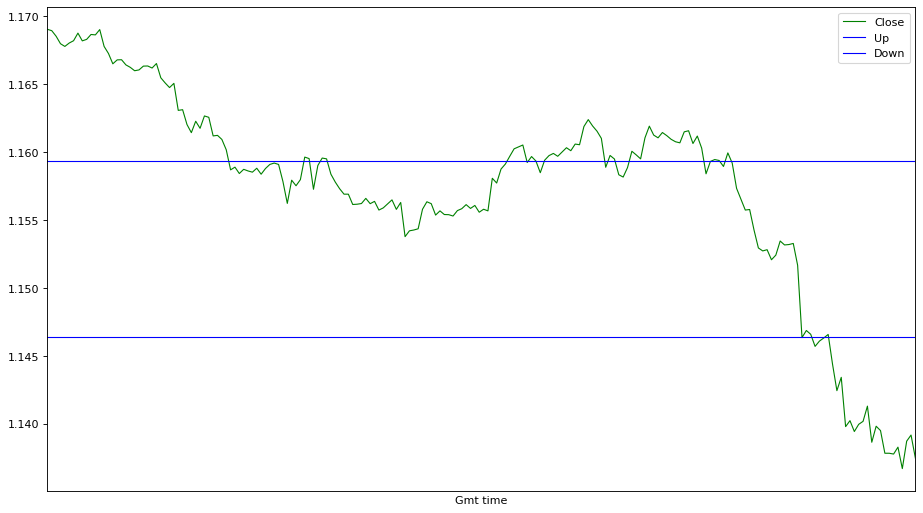

In [5]:
figure(num=None, figsize=(14, 8), dpi=80, facecolor='w', edgecolor='k')
ax = plt.gca()
DF_EURUSD_ASK.plot(kind='line',x='Gmt time',y='Close', color='green', ax=ax, linewidth=1)
DF_EURUSD_ASK.plot(kind='line',x='Gmt time',y='Up', color='blue', ax=ax, linewidth=1)
DF_EURUSD_ASK.plot(kind='line',x='Gmt time',y='Down', color='blue', ax=ax, linewidth=1)
plt.xticks([])
plt.show()

In [7]:
class RSI(Strategy):
    VAR1 = 0.00045
    VAR2 = -0.00065
    def init(self):
        Close = self.data.Close
        RSI = self.data.rsi
        
        self.Upper = self.data.Up + (self.VAR1)
        self.Lower = self.data.Down + (self.VAR2)
        
        self.flag = False
    
    def next(self):
            rsi = self.data.rsi[-1]
            close = self.data.Close[-1]
            if rsi > self.Upper[-1] and not self.flag:
                self.flag = True
                self.sell()
            if rsi < self.Lower[-1] and self.flag:
                self.flag = False
                self.buy()
            
class composable(SignalStrategy, TrailingStrategy):
    def init(self):
        super().init()
        self.set_signal(self.data.position)
        self.set_trailing_sl(4)
        

In [8]:
bt = Backtest(DF_EURUSD_ASK, RSI, cash=1000, commission=.000)
bt.run()

/Users/marami3/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Data index is not datetime. Assuming simple periods.
  """Entry point for launching an IPython kernel.


Start                            0
End                            199
Duration                       199
Exposure [%]               27.6382
Equity Final [$]           990.516
Equity Peak [$]            1005.14
Return [%]               -0.948414
Buy & Hold Return [%]      2.70219
Max. Drawdown [%]         -1.52048
Avg. Drawdown [%]        -0.145264
Max. Drawdown Duration          26
Avg. Drawdown Duration        10.4
# Trades                         1
Win Rate [%]                   100
Best Trade [%]            0.514624
Worst Trade [%]           0.514624
Avg. Trade [%]            0.514624
Max. Trade Duration             55
Avg. Trade Duration             55
Expectancy [%]                 NaN
SQN                            NaN
Sharpe Ratio                   NaN
Sortino Ratio                  NaN
Calmar Ratio              0.338462
_strategy                      RSI
dtype: object

In [9]:
bt.plot()

In [10]:
values = []
def frange(start, stop=None, step=None):
    #Use float number in range() function

    # if stop and step argument is null set start=0.0 and step = 1.0
    if stop == None:
        stop = start + 0.0
        start = 0.0

    if step == None:
        step = 1.0

    while True:
        if step > 0 and start >= stop:
            break
        elif step < 0 and start <= stop:
            break
        yield ("%g" % start) # return float number
        start = start + step

print ("\n Using negative floating point numbers in range")
for i in frange(-0.00095, 0.0005, 0.0001):
    values.append(float(i))
    #rint (i, end=", ")
print(values)    


 Using negative floating point numbers in range
[-0.00095, -0.00085, -0.00075, -0.00065, -0.00055, -0.00045, -0.00035, -0.00025, -0.00015, -5e-05, 5e-05, 0.00015, 0.00025, 0.00035, 0.00045]


In [11]:

    
%%time

stats = bt.optimize(VAR1=values, VAR2=values,
                    maximize='Equity Final [$]')
stats

CPU times: user 273 ms, sys: 101 ms, total: 374 ms
Wall time: 21.3 s


Start                                                   0
End                                                   199
Duration                                              199
Exposure [%]                                      27.6382
Equity Final [$]                                  990.516
Equity Peak [$]                                   1005.14
Return [%]                                      -0.948414
Buy & Hold Return [%]                             2.70219
Max. Drawdown [%]                                -1.52048
Avg. Drawdown [%]                               -0.145264
Max. Drawdown Duration                                 26
Avg. Drawdown Duration                               10.4
# Trades                                                1
Win Rate [%]                                          100
Best Trade [%]                                   0.514624
Worst Trade [%]                                  0.514624
Avg. Trade [%]                                   0.514624
Max. Trade Dur

In [12]:
class MAW(Strategy):
    

    def init(self):
        array_close = []
        self.i = 1
        self.array_Close = self.data.Close
        self.array_Open = self.data.Open
        
        self.flag = False
        
    
    def next(self):
            Close = self.data.Close
            Open = self.data.Open
            high = self.data.High[0]
            close = self.data.Close[-1]
            open = self.data.Open[-1]
            low = self.data.Low[0]
            close_i = self.array_Close[self.i+1]
            
            #print('close: ',close)
            #print('open: ',open)
            #print('close i: ',self.array_Close[self.i+1])
            
            if close_i > close and not self.flag:
                diff = abs((close_i - close)*100)
                if diff > .005:
                    self.flag = True
                    self.buy()
                    print('buy :', diff)
            if close_i < close and self.flag:
                diff2 = abs((close - close_i)*100)
                if diff2 > .005:
                    self.flag = False
                    #print('diff2 ',diff2)
                    self.sell()
            #print('i: ',self.i)
            if self.i+2 < len(self.array_Close):
                self.i=self.i+1

In [13]:
bt = Backtest(DF_EURUSD_ASK, MAW, cash=1000, commission=.005)
bt.run()

/Users/marami3/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Data index is not datetime. Assuming simple periods.
  """Entry point for launching an IPython kernel.


buy : 0.02500000000000835
buy : 0.01100000000000545
buy : 0.02900000000001235
buy : 0.006000000000017103
buy : 0.032999999999994145
buy : 0.031000000000003247
buy : 0.0050000000000105516
buy : 0.08399999999999519
buy : 0.09099999999999664
buy : 0.019999999999997797
buy : 0.031000000000003247
buy : 0.029000000000034554
buy : 0.0420000000000087
buy : 0.17100000000001003
buy : 0.045000000000006146
buy : 0.17500000000001403
buy : 0.0380000000000047
buy : 0.017000000000000348
buy : 0.015999999999993797
buy : 0.05100000000002325
buy : 0.042999999999993044
buy : 0.030999999999981043
buy : 0.039999999999995595
buy : 0.021999999999988695
buy : 0.0220000000000109
buy : 0.24000000000001798
buy : 0.10300000000000864
buy : 0.04399999999997739
buy : 0.09200000000000319
buy : 0.0320000000000098
buy : 0.04900000000001015
buy : 0.13399999999998968
buy : 0.08700000000001484
buy : 0.06999999999999229
buy : 0.15499999999999403
buy : 0.03900000000001125
buy : 0.08099999999999774
buy : 0.055000000000005045


Start                            0
End                            199
Duration                       199
Exposure [%]               97.4874
Equity Final [$]           666.071
Equity Peak [$]               1000
Return [%]                -33.3929
Buy & Hold Return [%]      2.70219
Max. Drawdown [%]         -33.3929
Avg. Drawdown [%]              NaN
Max. Drawdown Duration         NaN
Avg. Drawdown Duration         NaN
# Trades                       101
Win Rate [%]                1.9802
Best Trade [%]            0.119796
Worst Trade [%]          -0.685739
Avg. Trade [%]           -0.399846
Max. Trade Duration              9
Avg. Trade Duration        1.92079
Expectancy [%]            0.404213
SQN                       -32.6864
Sharpe Ratio              -3.45635
Sortino Ratio             -4.40589
Calmar Ratio             -0.011974
_strategy                      MAW
dtype: object

In [14]:
bt.plot()

In [139]:
#Moving Average  
def MA(df, n): 
    MA = pd.Series(df['Close'].rolling(n).mean(), name = 'MA_' + str(n)) 
    df = df.join(MA)  
    return df

In [140]:

DF_EURUSD_ASK = MA(DF_EURUSD_ASK, 5)
print(DF_EURUSD_ASK)

                     Gmt time     Open     High      Low    Close      Volume  \
0     01.08.2018 00:00:00.000  1.16894  1.16926  1.16885  1.16905   6394.8501   
1     01.08.2018 01:00:00.000  1.16905  1.16914  1.16832  1.16895   7304.5498   
2     01.08.2018 02:00:00.000  1.16896  1.16920  1.16823  1.16854   6709.3501   
3     01.08.2018 03:00:00.000  1.16854  1.16880  1.16799  1.16799   6154.0601   
4     01.08.2018 04:00:00.000  1.16799  1.16833  1.16761  1.16779   5269.6699   
5     01.08.2018 05:00:00.000  1.16779  1.16821  1.16761  1.16804   8515.1699   
6     01.08.2018 06:00:00.000  1.16805  1.16857  1.16723  1.16821  14354.9902   
7     01.08.2018 07:00:00.000  1.16821  1.16942  1.16770  1.16877  14436.9502   
8     01.08.2018 08:00:00.000  1.16877  1.16905  1.16815  1.16820  11943.6904   
9     01.08.2018 09:00:00.000  1.16820  1.16855  1.16775  1.16831  10390.4805   
10    01.08.2018 10:00:00.000  1.16831  1.16875  1.16807  1.16867  10072.8203   
11    01.08.2018 11:00:00.00

In [141]:
def EMA(df, n):
    EMA = pd.Series(DF_EURUSD_ASK['Close'].ewm(com=0.5).mean(), name = 'EMA_' + str(n))
    df = df.join(EMA)  
    return df

In [142]:
DF_EURUSD_ASK = EMA(DF_EURUSD_ASK, 5)
print(DF_EURUSD_ASK.tail(5))

                     Gmt time     Open     High      Low    Close      Volume  \
6246  01.08.2019 19:00:00.000  1.10854  1.10945  1.10798  1.10930  30454.0801   
6247  01.08.2019 20:00:00.000  1.10928  1.10938  1.10837  1.10855  10253.6504   
6248  01.08.2019 21:00:00.000  1.10855  1.10862  1.10805  1.10833   4365.2798   
6249  01.08.2019 22:00:00.000  1.10835  1.10850  1.10748  1.10788   4208.5298   
6250  01.08.2019 23:00:00.000  1.10787  1.10833  1.10780  1.10793   6057.7402   

           rsi        Up      Down            datetime  day_of_week      MA_5  \
6246  1.149341  1.156806  1.126054 2019-01-08 19:00:00            1  1.107822   
6247  1.146194  1.156806  1.126054 2019-01-08 20:00:00            1  1.108314   
6248  1.145287  1.156806  1.126054 2019-01-08 21:00:00            1  1.108608   
6249  1.143417  1.156806  1.126054 2019-01-08 22:00:00            1  1.108520   
6250  1.143609  1.156806  1.126054 2019-01-08 23:00:00            1  1.108398   

         EMA_5  
6246  1.1

In [143]:
#Momentum  
def MOM(df, n):  
    M = pd.Series(df['Close'].diff(n), name = 'Momentum_' + str(n))  
    df = df.join(M)  
    return df

In [144]:
DF_EURUSD_ASK = MOM(DF_EURUSD_ASK, 5)
print(DF_EURUSD_ASK.tail(5))

                     Gmt time     Open     High      Low    Close      Volume  \
6246  01.08.2019 19:00:00.000  1.10854  1.10945  1.10798  1.10930  30454.0801   
6247  01.08.2019 20:00:00.000  1.10928  1.10938  1.10837  1.10855  10253.6504   
6248  01.08.2019 21:00:00.000  1.10855  1.10862  1.10805  1.10833   4365.2798   
6249  01.08.2019 22:00:00.000  1.10835  1.10850  1.10748  1.10788   4208.5298   
6250  01.08.2019 23:00:00.000  1.10787  1.10833  1.10780  1.10793   6057.7402   

           rsi        Up      Down            datetime  day_of_week      MA_5  \
6246  1.149341  1.156806  1.126054 2019-01-08 19:00:00            1  1.107822   
6247  1.146194  1.156806  1.126054 2019-01-08 20:00:00            1  1.108314   
6248  1.145287  1.156806  1.126054 2019-01-08 21:00:00            1  1.108608   
6249  1.143417  1.156806  1.126054 2019-01-08 22:00:00            1  1.108520   
6250  1.143609  1.156806  1.126054 2019-01-08 23:00:00            1  1.108398   

         EMA_5  Momentum_5

In [145]:
#Rate of Change  
def ROC(df, n):  
    M = df['Close'].diff(n - 1)  
    N = df['Close'].shift(n - 1)  
    ROC = pd.Series(M / N, name = 'ROC_' + str(n))  
    df = df.join(ROC)  
    return df

In [146]:
DF_EURUSD_ASK = ROC(DF_EURUSD_ASK, 5)
print(DF_EURUSD_ASK.tail(5))

                     Gmt time     Open     High      Low    Close      Volume  \
6246  01.08.2019 19:00:00.000  1.10854  1.10945  1.10798  1.10930  30454.0801   
6247  01.08.2019 20:00:00.000  1.10928  1.10938  1.10837  1.10855  10253.6504   
6248  01.08.2019 21:00:00.000  1.10855  1.10862  1.10805  1.10833   4365.2798   
6249  01.08.2019 22:00:00.000  1.10835  1.10850  1.10748  1.10788   4208.5298   
6250  01.08.2019 23:00:00.000  1.10787  1.10833  1.10780  1.10793   6057.7402   

           rsi        Up      Down            datetime  day_of_week      MA_5  \
6246  1.149341  1.156806  1.126054 2019-01-08 19:00:00            1  1.107822   
6247  1.146194  1.156806  1.126054 2019-01-08 20:00:00            1  1.108314   
6248  1.145287  1.156806  1.126054 2019-01-08 21:00:00            1  1.108608   
6249  1.143417  1.156806  1.126054 2019-01-08 22:00:00            1  1.108520   
6250  1.143609  1.156806  1.126054 2019-01-08 23:00:00            1  1.108398   

         EMA_5  Momentum_5

In [147]:
#Average True Range  
def ATR(df, n):  
    i = 0  
    TR_l = [0]  
    while i < df.index[-1]:  
        TR = max(df.get_value(i + 1, 'High'), df.get_value(i, 'Close')) - min(df.get_value(i + 1, 'Low'), df.get_value(i, 'Close'))  
        TR_l.append(TR)  
        i = i + 1  
    TR_s = pd.Series(TR_l)  
    ATR = pd.Series(df['Close'].ewm(com=n).mean(), name = 'ATR_' + str(n))  
    df = df.join(ATR)  
    return df

In [148]:
DF_EURUSD_ASK = ATR(DF_EURUSD_ASK, .5)
print(DF_EURUSD_ASK.tail(5))

                     Gmt time     Open     High      Low    Close      Volume  \
6246  01.08.2019 19:00:00.000  1.10854  1.10945  1.10798  1.10930  30454.0801   
6247  01.08.2019 20:00:00.000  1.10928  1.10938  1.10837  1.10855  10253.6504   
6248  01.08.2019 21:00:00.000  1.10855  1.10862  1.10805  1.10833   4365.2798   
6249  01.08.2019 22:00:00.000  1.10835  1.10850  1.10748  1.10788   4208.5298   
6250  01.08.2019 23:00:00.000  1.10787  1.10833  1.10780  1.10793   6057.7402   

           rsi        Up      Down            datetime  day_of_week      MA_5  \
6246  1.149341  1.156806  1.126054 2019-01-08 19:00:00            1  1.107822   
6247  1.146194  1.156806  1.126054 2019-01-08 20:00:00            1  1.108314   
6248  1.145287  1.156806  1.126054 2019-01-08 21:00:00            1  1.108608   
6249  1.143417  1.156806  1.126054 2019-01-08 22:00:00            1  1.108520   
6250  1.143609  1.156806  1.126054 2019-01-08 23:00:00            1  1.108398   

         EMA_5  Momentum_5

/Users/marami3/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  


In [149]:
#Bollinger Bands  
def BBANDS(df, n):  
    MA = pd.Series(pd.Series(df['Close'].rolling(n).mean()))  
    MSD = pd.Series(pd.Series(df['Close'].rolling(n).std()))  
    b1 = 4 * MSD / MA  
    B1 = pd.Series(b1, name = 'BollingerB_' + str(n))  
    df = df.join(B1)  
    b2 = (df['Close'] - MA + 2 * MSD) / (4 * MSD)  
    B2 = pd.Series(b2, name = 'Bollinger%b_' + str(n))  
    df = df.join(B2)  
    return df

In [150]:
DF_EURUSD_ASK = BBANDS(DF_EURUSD_ASK, 5)
print(DF_EURUSD_ASK.tail(5))

                     Gmt time     Open     High      Low    Close      Volume  \
6246  01.08.2019 19:00:00.000  1.10854  1.10945  1.10798  1.10930  30454.0801   
6247  01.08.2019 20:00:00.000  1.10928  1.10938  1.10837  1.10855  10253.6504   
6248  01.08.2019 21:00:00.000  1.10855  1.10862  1.10805  1.10833   4365.2798   
6249  01.08.2019 22:00:00.000  1.10835  1.10850  1.10748  1.10788   4208.5298   
6250  01.08.2019 23:00:00.000  1.10787  1.10833  1.10780  1.10793   6057.7402   

           rsi        Up      Down            datetime  day_of_week      MA_5  \
6246  1.149341  1.156806  1.126054 2019-01-08 19:00:00            1  1.107822   
6247  1.146194  1.156806  1.126054 2019-01-08 20:00:00            1  1.108314   
6248  1.145287  1.156806  1.126054 2019-01-08 21:00:00            1  1.108608   
6249  1.143417  1.156806  1.126054 2019-01-08 22:00:00            1  1.108520   
6250  1.143609  1.156806  1.126054 2019-01-08 23:00:00            1  1.108398   

         EMA_5  Momentum_5

In [151]:
#Pivot Points, Supports and Resistances  
def PPSR(df):  
    PP = pd.Series((df['High'] + df['Low'] + df['Close']) / 3)  
    R1 = pd.Series(2 * PP - df['Low'])  
    S1 = pd.Series(2 * PP - df['High'])  
    R2 = pd.Series(PP + df['High'] - df['Low'])  
    S2 = pd.Series(PP - df['High'] + df['Low'])  
    R3 = pd.Series(df['High'] + 2 * (PP - df['Low']))  
    S3 = pd.Series(df['Low'] - 2 * (df['High'] - PP))  
    psr = {'PP':PP, 'R1':R1, 'S1':S1, 'R2':R2, 'S2':S2, 'R3':R3, 'S3':S3}  
    PSR = pd.DataFrame(psr)  
    df = df.join(PSR)  
    return df

In [152]:
DF_EURUSD_ASK = PPSR(DF_EURUSD_ASK)
print(DF_EURUSD_ASK.tail(5))

                     Gmt time     Open     High      Low    Close      Volume  \
6246  01.08.2019 19:00:00.000  1.10854  1.10945  1.10798  1.10930  30454.0801   
6247  01.08.2019 20:00:00.000  1.10928  1.10938  1.10837  1.10855  10253.6504   
6248  01.08.2019 21:00:00.000  1.10855  1.10862  1.10805  1.10833   4365.2798   
6249  01.08.2019 22:00:00.000  1.10835  1.10850  1.10748  1.10788   4208.5298   
6250  01.08.2019 23:00:00.000  1.10787  1.10833  1.10780  1.10793   6057.7402   

           rsi        Up      Down            datetime  ...   ATR_0.5  \
6246  1.149341  1.156806  1.126054 2019-01-08 19:00:00  ...  1.108955   
6247  1.146194  1.156806  1.126054 2019-01-08 20:00:00  ...  1.108685   
6248  1.145287  1.156806  1.126054 2019-01-08 21:00:00  ...  1.108448   
6249  1.143417  1.156806  1.126054 2019-01-08 22:00:00  ...  1.108069   
6250  1.143609  1.156806  1.126054 2019-01-08 23:00:00  ...  1.107976   

      BollingerB_5  Bollinger%b_5        PP        R1        S1        R2 

In [126]:
#Stochastic oscillator %K  
def STOK(df):  
    SOk = pd.Series((df['Close'] - df['Low']) / (df['High'] - df['Low']), name = 'SO%k')  
    df = df.join(SOk)  
    return df

In [127]:
DF_EURUSD_ASK = STOK(DF_EURUSD_ASK)
print(DF_EURUSD_ASK.tail(5))

                     Gmt time     Open     High      Low    Close      Volume  \
6246  01.08.2019 19:00:00.000  1.10854  1.10945  1.10798  1.10930  30454.0801   
6247  01.08.2019 20:00:00.000  1.10928  1.10938  1.10837  1.10855  10253.6504   
6248  01.08.2019 21:00:00.000  1.10855  1.10862  1.10805  1.10833   4365.2798   
6249  01.08.2019 22:00:00.000  1.10835  1.10850  1.10748  1.10788   4208.5298   
6250  01.08.2019 23:00:00.000  1.10787  1.10833  1.10780  1.10793   6057.7402   

           rsi        Up      Down            datetime  day_of_week      MA_5  \
6246  1.149341  1.156806  1.126054 2019-01-08 19:00:00            1  1.107822   
6247  1.146194  1.156806  1.126054 2019-01-08 20:00:00            1  1.108314   
6248  1.145287  1.156806  1.126054 2019-01-08 21:00:00            1  1.108608   
6249  1.143417  1.156806  1.126054 2019-01-08 22:00:00            1  1.108520   
6250  1.143609  1.156806  1.126054 2019-01-08 23:00:00            1  1.108398   

         EMA_5  Momentum_5

In [153]:
# Stochastic Oscillator, EMA smoothing, nS = slowing (1 if no slowing)  
def STO(df,  nK, nD, nS=1):  
    SOk = pd.Series((df['Close'] - df['Low'].rolling(nK).min()) / (df['High'].rolling(nK).max() - df['Low'].rolling(nK).min()), name = 'SO%k'+str(nK))  
    SOd = pd.Series(SOk.ewm(ignore_na=False, span=nD, min_periods=nD-1, adjust=True).mean(), name = 'SO%d'+str(nD))  
    SOk = SOk.ewm(ignore_na=False, span=nS, min_periods=nS-1, adjust=True).mean()  
    SOd = SOd.ewm(ignore_na=False, span=nS, min_periods=nS-1, adjust=True).mean()  
    df = df.join(SOk)  
    df = df.join(SOd)  
    return df  

In [154]:
DF_EURUSD_ASK = STO(DF_EURUSD_ASK,1,2)
print(DF_EURUSD_ASK.tail(5))

                     Gmt time     Open     High      Low    Close      Volume  \
6246  01.08.2019 19:00:00.000  1.10854  1.10945  1.10798  1.10930  30454.0801   
6247  01.08.2019 20:00:00.000  1.10928  1.10938  1.10837  1.10855  10253.6504   
6248  01.08.2019 21:00:00.000  1.10855  1.10862  1.10805  1.10833   4365.2798   
6249  01.08.2019 22:00:00.000  1.10835  1.10850  1.10748  1.10788   4208.5298   
6250  01.08.2019 23:00:00.000  1.10787  1.10833  1.10780  1.10793   6057.7402   

           rsi        Up      Down            datetime  ...  Bollinger%b_5  \
6246  1.149341  1.156806  1.126054 2019-01-08 19:00:00  ...       0.781879   
6247  1.146194  1.156806  1.126054 2019-01-08 20:00:00  ...       0.566035   
6248  1.145287  1.156806  1.126054 2019-01-08 21:00:00  ...       0.327203   
6249  1.143417  1.156806  1.126054 2019-01-08 22:00:00  ...       0.188512   
6250  1.143609  1.156806  1.126054 2019-01-08 23:00:00  ...       0.296996   

            PP        R1        S1        R2

In [161]:
#Trix  
def TRIX(df, n):  
    EX1 = df['Close'].ewm(span = n, min_periods = n - 1).mean()
    EX2 = EX1.ewm(span = n, min_periods = n - 1).mean()  
    EX3 = EX2.ewm(span = n, min_periods = n - 1).mean()  
    i = 0  
    ROC_l = [0]  
    while i + 1 <= df.index[-1]:  
        ROC = (EX3[i + 1] - EX3[i]) / EX3[i]  
        ROC_l.append(ROC)  
        i = i + 1  
    Trix = pd.Series(ROC_l, name = 'Trix_' + str(n))  
    df = df.join(Trix)  
    return df

In [162]:
DF_EURUSD_ASK = TRIX(DF_EURUSD_ASK,5)
print(DF_EURUSD_ASK.tail(5))

                     Gmt time     Open     High      Low    Close      Volume  \
6246  01.08.2019 19:00:00.000  1.10854  1.10945  1.10798  1.10930  30454.0801   
6247  01.08.2019 20:00:00.000  1.10928  1.10938  1.10837  1.10855  10253.6504   
6248  01.08.2019 21:00:00.000  1.10855  1.10862  1.10805  1.10833   4365.2798   
6249  01.08.2019 22:00:00.000  1.10835  1.10850  1.10748  1.10788   4208.5298   
6250  01.08.2019 23:00:00.000  1.10787  1.10833  1.10780  1.10793   6057.7402   

           rsi        Up      Down            datetime  ...        PP  \
6246  1.149341  1.156806  1.126054 2019-01-08 19:00:00  ...  1.108910   
6247  1.146194  1.156806  1.126054 2019-01-08 20:00:00  ...  1.108767   
6248  1.145287  1.156806  1.126054 2019-01-08 21:00:00  ...  1.108333   
6249  1.143417  1.156806  1.126054 2019-01-08 22:00:00  ...  1.107953   
6250  1.143609  1.156806  1.126054 2019-01-08 23:00:00  ...  1.108020   

            R1        S1        R2        S2        R3        S3     SO%k1

In [172]:
#Average Directional Movement Index  
def ADX(df, n, n_ADX):  
    i = 0  
    UpI = []  
    DoI = []  
    while i + 1 <= df.index[-1]:  
        UpMove = df.get_value(i + 1, 'High') - df.get_value(i, 'High')  
        DoMove = df.get_value(i, 'Low') - df.get_value(i + 1, 'Low')  
        if UpMove > DoMove and UpMove > 0:  
            UpD = UpMove  
        else: UpD = 0  
        UpI.append(UpD)  
        if DoMove > UpMove and DoMove > 0:  
            DoD = DoMove  
        else: DoD = 0  
        DoI.append(DoD)  
        i = i + 1  
    i = 0  
    TR_l = [0]  
    while i < df.index[-1]:  
        TR = max(df.get_value(i + 1, 'High'), df.get_value(i, 'Close')) - min(df.get_value(i + 1, 'Low'), df.get_value(i, 'Close'))  
        TR_l.append(TR)  
        i = i + 1  
    TR_s = pd.Series(TR_l)  
    ATR = TR_s.ewm(span = n, min_periods = n).mean() 
    UpI = pd.Series(UpI)  
    DoI = pd.Series(DoI)  
    PosDI = UpI.ewm(span = n, min_periods = n-1).mean()
    NegDI = DoI.ewm(span = n, min_periods = n-1).mean() / ATR 
    abs = abs(PosDI - NegDI)
    ADX = pd.Series(abs.ewm(span = n, min_periods = n-1).mean() / (PosDI + NegDI), span = n_ADX, min_periods = n_ADX - 1), name = 'ADX_' + str(n) + '_' + str(n_ADX))  
    df = df.join(ADX)  
    return df

SyntaxError: invalid syntax (<ipython-input-172-1f6c11c9b268>, line 31)

In [173]:
DF_EURUSD_ASK = ADX(DF_EURUSD_ASK,5,10)
print(DF_EURUSD_ASK.tail(5))

/Users/marami3/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  import sys
/Users/marami3/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  
/Users/marami3/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: FutureWarning: get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


AttributeError: module 'pandas' has no attribute 'ewma'

In [177]:
#MACD, MACD Signal and MACD difference  
def MACD(df, n_fast, n_slow):  
    EMAfast = pd.Series(df['Close'].ewm(span = n_fast, min_periods = n_slow-1).mean())
    EMAslow = pd.Series(df['Close'].ewm(span = n_slow, min_periods = n_fast-1).mean())
    MACD = pd.Series(EMAfast - EMAslow, name = 'MACD_' + str(n_fast) + '_' + str(n_slow))  
    MACDsign = pd.Series(MACD.ewm(span = 9, min_periods = 8).mean(), name = 'MACDsign_' + str(n_fast) + '_' + str(n_slow))  
    MACDdiff = pd.Series(MACD - MACDsign, name = 'MACDdiff_' + str(n_fast) + '_' + str(n_slow))  
    df = df.join(MACD)  
    df = df.join(MACDsign)  
    df = df.join(MACDdiff)  
    return df

In [178]:
DF_EURUSD_ASK = MACD(DF_EURUSD_ASK,5,25)
print(DF_EURUSD_ASK.tail(5))

                     Gmt time     Open     High      Low    Close      Volume  \
6246  01.08.2019 19:00:00.000  1.10854  1.10945  1.10798  1.10930  30454.0801   
6247  01.08.2019 20:00:00.000  1.10928  1.10938  1.10837  1.10855  10253.6504   
6248  01.08.2019 21:00:00.000  1.10855  1.10862  1.10805  1.10833   4365.2798   
6249  01.08.2019 22:00:00.000  1.10835  1.10850  1.10748  1.10788   4208.5298   
6250  01.08.2019 23:00:00.000  1.10787  1.10833  1.10780  1.10793   6057.7402   

           rsi        Up      Down            datetime  ...        R2  \
6246  1.149341  1.156806  1.126054 2019-01-08 19:00:00  ...  1.110380   
6247  1.146194  1.156806  1.126054 2019-01-08 20:00:00  ...  1.109777   
6248  1.145287  1.156806  1.126054 2019-01-08 21:00:00  ...  1.108903   
6249  1.143417  1.156806  1.126054 2019-01-08 22:00:00  ...  1.108973   
6250  1.143609  1.156806  1.126054 2019-01-08 23:00:00  ...  1.108550   

            S2        R3        S3     SO%k1     SO%d2    Trix_5  MACD_5_2

In [191]:
#Mass Index  
def MassI(df):  
    Range = df['High'] - df['Low']  
    EX1 = Range.ewm(span = 9, min_periods = 8).mean()
    EX2 = EX1.ewm(span = 9, min_periods = 8).mean()
    Mass = EX1 / EX2  
    MassI = pd.Series(Mass.rolling(25).sum(),name = 'Mass Index')  
    df = df.join(MassI)  
    return df

In [192]:
DF_EURUSD_ASK = MassI(DF_EURUSD_ASK)
print(DF_EURUSD_ASK.tail(5))

                     Gmt time     Open     High      Low    Close      Volume  \
6246  01.08.2019 19:00:00.000  1.10854  1.10945  1.10798  1.10930  30454.0801   
6247  01.08.2019 20:00:00.000  1.10928  1.10938  1.10837  1.10855  10253.6504   
6248  01.08.2019 21:00:00.000  1.10855  1.10862  1.10805  1.10833   4365.2798   
6249  01.08.2019 22:00:00.000  1.10835  1.10850  1.10748  1.10788   4208.5298   
6250  01.08.2019 23:00:00.000  1.10787  1.10833  1.10780  1.10793   6057.7402   

           rsi        Up      Down            datetime  ...        S2  \
6246  1.149341  1.156806  1.126054 2019-01-08 19:00:00  ...  1.107440   
6247  1.146194  1.156806  1.126054 2019-01-08 20:00:00  ...  1.107757   
6248  1.145287  1.156806  1.126054 2019-01-08 21:00:00  ...  1.107763   
6249  1.143417  1.156806  1.126054 2019-01-08 22:00:00  ...  1.106933   
6250  1.143609  1.156806  1.126054 2019-01-08 23:00:00  ...  1.107490   

            R3        S3     SO%k1     SO%d2    Trix_5  MACD_5_25  \
6246 

In [193]:
#Vortex Indicator: http://www.vortexindicator.com/VFX_VORTEX.PDF  
def Vortex(df, n):  
    i = 0  
    TR = [0]  
    while i < df.index[-1]:  
        Range = max(df.get_value(i + 1, 'High'), df.get_value(i, 'Close')) - min(df.get_value(i + 1, 'Low'), df.get_value(i, 'Close'))  
        TR.append(Range)  
        i = i + 1  
    i = 0  
    VM = [0]  
    while i < df.index[-1]:  
        Range = abs(df.get_value(i + 1, 'High') - df.get_value(i, 'Low')) - abs(df.get_value(i + 1, 'Low') - df.get_value(i, 'High'))  
        VM.append(Range)  
        i = i + 1  
    VI = pd.Series(pd.rolling_sum(pd.Series(VM), n) / pd.rolling_sum(pd.Series(TR), n), name = 'Vortex_' + str(n))  
    df = df.join(VI)  
    return df


In [ ]:
#KST Oscillator  
def KST(df, r1, r2, r3, r4, n1, n2, n3, n4):  
    M = df['Close'].diff(r1 - 1)  
    N = df['Close'].shift(r1 - 1)  
    ROC1 = M / N  
    M = df['Close'].diff(r2 - 1)  
    N = df['Close'].shift(r2 - 1)  
    ROC2 = M / N  
    M = df['Close'].diff(r3 - 1)  
    N = df['Close'].shift(r3 - 1)  
    ROC3 = M / N  
    M = df['Close'].diff(r4 - 1)  
    N = df['Close'].shift(r4 - 1)  
    ROC4 = M / N  
    KST = pd.Series(pd.rolling_sum(ROC1, n1) + pd.rolling_sum(ROC2, n2) * 2 + pd.rolling_sum(ROC3, n3) * 3 + pd.rolling_sum(ROC4, n4) * 4, name = 'KST_' + str(r1) + '_' + str(r2) + '_' + str(r3) + '_' + str(r4) + '_' + str(n1) + '_' + str(n2) + '_' + str(n3) + '_' + str(n4))  
    df = df.join(KST)  
    return df

In [ ]:
#Relative Strength Index  
def RSI(df, n):  
    i = 0  
    UpI = [0]  
    DoI = [0]  
    while i + 1 <= df.index[-1]:  
        UpMove = df.get_value(i + 1, 'High') - df.get_value(i, 'High')  
        DoMove = df.get_value(i, 'Low') - df.get_value(i + 1, 'Low')  
        if UpMove > DoMove and UpMove > 0:  
            UpD = UpMove  
        else: UpD = 0  
        UpI.append(UpD)  
        if DoMove > UpMove and DoMove > 0:  
            DoD = DoMove  
        else: DoD = 0  
        DoI.append(DoD)  
        i = i + 1  
    UpI = pd.Series(UpI)  
    DoI = pd.Series(DoI)  
    PosDI = pd.Series(pd.ewma(UpI, span = n, min_periods = n - 1))  
    NegDI = pd.Series(pd.ewma(DoI, span = n, min_periods = n - 1))  
    RSI = pd.Series(PosDI / (PosDI + NegDI), name = 'RSI_' + str(n))  
    df = df.join(RSI)  
    return df

In [ ]:
#True Strength Index  
def TSI(df, r, s):  
    M = pd.Series(df['Close'].diff(1))  
    aM = abs(M)  
    EMA1 = pd.Series(pd.ewma(M, span = r, min_periods = r - 1))  
    aEMA1 = pd.Series(pd.ewma(aM, span = r, min_periods = r - 1))  
    EMA2 = pd.Series(pd.ewma(EMA1, span = s, min_periods = s - 1))  
    aEMA2 = pd.Series(pd.ewma(aEMA1, span = s, min_periods = s - 1))  
    TSI = pd.Series(EMA2 / aEMA2, name = 'TSI_' + str(r) + '_' + str(s))  
    df = df.join(TSI)  
    return df

In [ ]:
#Accumulation/Distribution  
def ACCDIST(df, n):  
    ad = (2 * df['Close'] - df['High'] - df['Low']) / (df['High'] - df['Low']) * df['Volume']  
    M = ad.diff(n - 1)  
    N = ad.shift(n - 1)  
    ROC = M / N  
    AD = pd.Series(ROC, name = 'Acc/Dist_ROC_' + str(n))  
    df = df.join(AD)  
    return df

In [ ]:
#Chaikin Oscillator  
def Chaikin(df):  
    ad = (2 * df['Close'] - df['High'] - df['Low']) / (df['High'] - df['Low']) * df['Volume']  
    Chaikin = pd.Series(pd.ewma(ad, span = 3, min_periods = 2) - pd.ewma(ad, span = 10, min_periods = 9), name = 'Chaikin')  
    df = df.join(Chaikin)  
    return df

In [ ]:
#Money Flow Index and Ratio  
def MFI(df, n):  
    PP = (df['High'] + df['Low'] + df['Close']) / 3  
    i = 0  
    PosMF = [0]  
    while i < df.index[-1]:  
        if PP[i + 1] > PP[i]:  
            PosMF.append(PP[i + 1] * df.get_value(i + 1, 'Volume'))  
        else:  
            PosMF.append(0)  
        i = i + 1  
    PosMF = pd.Series(PosMF)  
    TotMF = PP * df['Volume']  
    MFR = pd.Series(PosMF / TotMF)  
    MFI = pd.Series(pd.rolling_mean(MFR, n), name = 'MFI_' + str(n))  
    df = df.join(MFI)  
    return df

In [ ]:
#On-balance Volume  
def OBV(df, n):  
    i = 0  
    OBV = [0]  
    while i < df.index[-1]:  
        if df.get_value(i + 1, 'Close') - df.get_value(i, 'Close') > 0:  
            OBV.append(df.get_value(i + 1, 'Volume'))  
        if df.get_value(i + 1, 'Close') - df.get_value(i, 'Close') == 0:  
            OBV.append(0)  
        if df.get_value(i + 1, 'Close') - df.get_value(i, 'Close') < 0:  
            OBV.append(-df.get_value(i + 1, 'Volume'))  
        i = i + 1  
    OBV = pd.Series(OBV)  
    OBV_ma = pd.Series(pd.rolling_mean(OBV, n), name = 'OBV_' + str(n))  
    df = df.join(OBV_ma)  
    return df

In [ ]:
#Force Index  
def FORCE(df, n):  
    F = pd.Series(df['Close'].diff(n) * df['Volume'].diff(n), name = 'Force_' + str(n))  
    df = df.join(F)  
    return df

In [ ]:
#Ease of Movement  
def EOM(df, n):  
    EoM = (df['High'].diff(1) + df['Low'].diff(1)) * (df['High'] - df['Low']) / (2 * df['Volume'])  
    Eom_ma = pd.Series(pd.rolling_mean(EoM, n), name = 'EoM_' + str(n))  
    df = df.join(Eom_ma)  
    return df

In [ ]:
#Commodity Channel Index  
def CCI(df, n):  
    PP = (df['High'] + df['Low'] + df['Close']) / 3  
    CCI = pd.Series((PP - pd.rolling_mean(PP, n)) / pd.rolling_std(PP, n), name = 'CCI_' + str(n))  
    df = df.join(CCI)  
    return df

In [ ]:
#Coppock Curve  
def COPP(df, n):  
    M = df['Close'].diff(int(n * 11 / 10) - 1)  
    N = df['Close'].shift(int(n * 11 / 10) - 1)  
    ROC1 = M / N  
    M = df['Close'].diff(int(n * 14 / 10) - 1)  
    N = df['Close'].shift(int(n * 14 / 10) - 1)  
    ROC2 = M / N  
    Copp = pd.Series(pd.ewma(ROC1 + ROC2, span = n, min_periods = n), name = 'Copp_' + str(n))  
    df = df.join(Copp)  
    return df

In [ ]:
#Keltner Channel  
def KELCH(df, n):  
    KelChM = pd.Series(pd.rolling_mean((df['High'] + df['Low'] + df['Close']) / 3, n), name = 'KelChM_' + str(n))  
    KelChU = pd.Series(pd.rolling_mean((4 * df['High'] - 2 * df['Low'] + df['Close']) / 3, n), name = 'KelChU_' + str(n))  
    KelChD = pd.Series(pd.rolling_mean((-2 * df['High'] + 4 * df['Low'] + df['Close']) / 3, n), name = 'KelChD_' + str(n))  
    df = df.join(KelChM)  
    df = df.join(KelChU)  
    df = df.join(KelChD)  
    return df

In [ ]:
#Ultimate Oscillator  
def ULTOSC(df):  
    i = 0  
    TR_l = [0]  
    BP_l = [0]  
    while i < df.index[-1]:  
        TR = max(df.get_value(i + 1, 'High'), df.get_value(i, 'Close')) - min(df.get_value(i + 1, 'Low'), df.get_value(i, 'Close'))  
        TR_l.append(TR)  
        BP = df.get_value(i + 1, 'Close') - min(df.get_value(i + 1, 'Low'), df.get_value(i, 'Close'))  
        BP_l.append(BP)  
        i = i + 1  
    UltO = pd.Series((4 * pd.rolling_sum(pd.Series(BP_l), 7) / pd.rolling_sum(pd.Series(TR_l), 7)) + (2 * pd.rolling_sum(pd.Series(BP_l), 14) / pd.rolling_sum(pd.Series(TR_l), 14)) + (pd.rolling_sum(pd.Series(BP_l), 28) / pd.rolling_sum(pd.Series(TR_l), 28)), name = 'Ultimate_Osc')  
    df = df.join(UltO)  
    return df

In [ ]:
#Donchian Channel  
def DONCH(df, n):  
    i = 0  
    DC_l = []  
    while i < n - 1:  
        DC_l.append(0)  
        i = i + 1  
    i = 0  
    while i + n - 1 < df.index[-1]:  
        DC = max(df['High'].ix[i:i + n - 1]) - min(df['Low'].ix[i:i + n - 1])  
        DC_l.append(DC)  
        i = i + 1  
    DonCh = pd.Series(DC_l, name = 'Donchian_' + str(n))  
    DonCh = DonCh.shift(n - 1)  
    df = df.join(DonCh)  
    return df

In [ ]:
#Standard Deviation  
def STDDEV(df, n):  
    df = df.join(pd.Series(pd.rolling_std(df['Close'], n), name = 'STD_' + str(n)))  
    return df  

/Users/marami3/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/marami3/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Users/marami3/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:3399: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


ValueError: array must not contain infs or NaNs

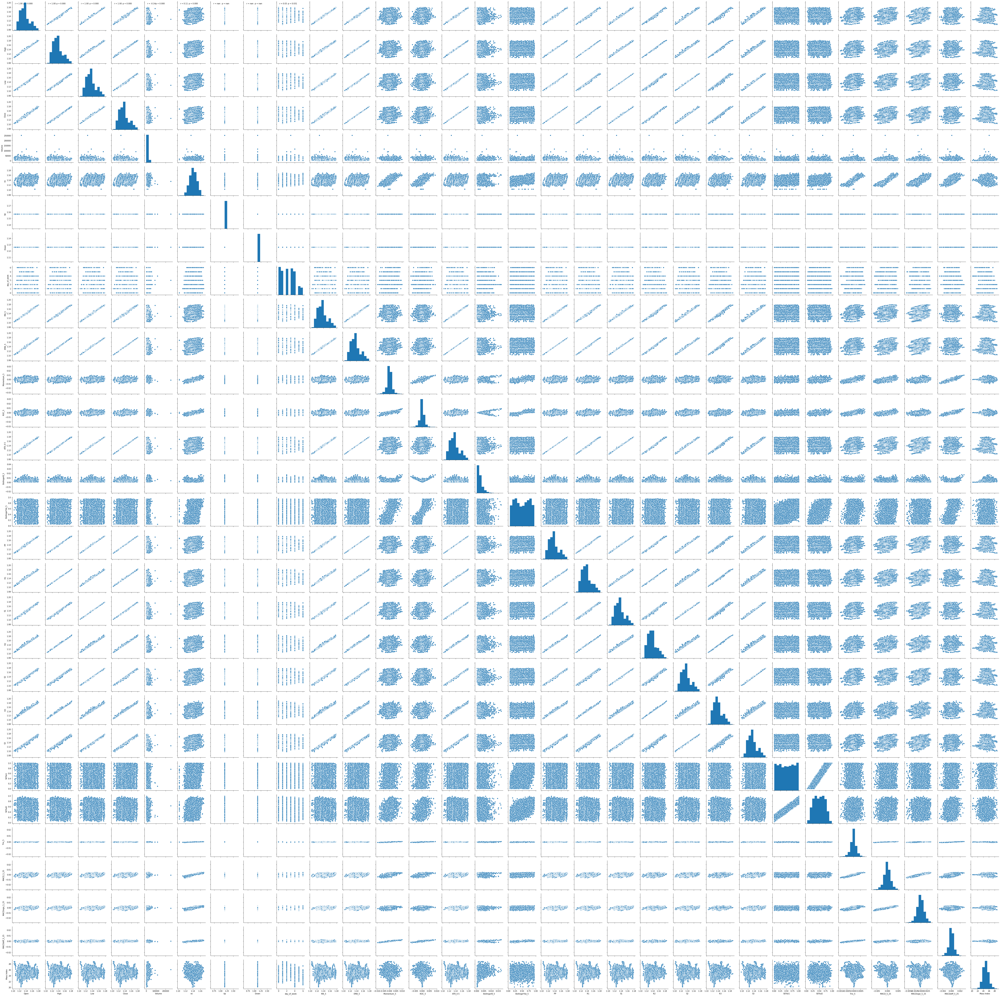

In [194]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

def corrfunc(x, y, **kws):
    (r, p) = pearsonr(x, y)
    ax = plt.gca()
    ax.annotate("r = {:.2f} ".format(r),
                xy=(.1, .9), xycoords=ax.transAxes)
    ax.annotate("p = {:.3f}".format(p),
                xy=(.4, .9), xycoords=ax.transAxes)
    
graph = sns.pairplot(DF_EURUSD_ASK);
graph.map(corrfunc)